## 1 - Configuration

### 1.1 - CAMS account authentication

In [1]:
from IPython.core.display import display, HTML

url_registration = 'https://apps.ecmwf.int/registration/'
display(HTML(f"""<a href={url_registration}>{'Please click here to regiter with ECMWF'}</a>"""))

### 1.2 - Log in and retrieve your key

In [2]:
url_login='https://apps.ecmwf.int/auth/login/'  
display(HTML(f"""<a href={url_login}>{'1 - Please click here to login'}</a>"""))

url_key='https://api.ecmwf.int/v1/key/'  
display(HTML(f"""<a href={url_key}>{'2 - Please click here to retrieve your key'}</a>"""))

### 1.3 Configure ECMWFapi

In [3]:
import os
from os import path

# insert your email and the key that you found in the previous step
ecmwf_email = '<your ECMWF email goes here>'
ecmwf_key = '<your ECMWF key goes here>'

content = f'{{\n    "url"   : "https://api.ecmwf.int/v1",\n    "key"   : "{ecmwf_key}",\n    "email" : "{ecmwf_email}"\n}}'

# write content to $HOME/.ecmwfapirc
with open(path.join(os.environ["HOME"], '.ecmwfapirc'), 'w') as f:
    f.write(content)

## 2 - Retrieve a Grib file

### 2.1 - Go to the ECMWF interface to see the available parameters

Choose a dataset, select the desired parameters and then, click on "View the Mars request" to see the Python script

In [4]:
url_datasets='https://confluence.ecmwf.int/display/WEBAPI/Available+ECMWF+Public+Datasets'  
display(HTML(f"""<a href={url_datasets}>{'Click here to see: Available ECMWF Public Datasets'}</a>"""))

url_interface='https://apps.ecmwf.int/datasets/'  
display(HTML(f"""<a href={url_interface}>{'Click here to see: ECMWF interface'}</a>"""))

### 2.2 - Create an output data folder

In [5]:
import ecmwfapi

# get the destination folder path
output_dir = path.join(os.environ['HOME'], 'work/cams_data/cams_ecmwfapi/')

#Create the folder if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

output_filename = path.join(output_dir, 'output.grib')

### 2.3 - Copy and paste the Python script below and replace "output" by filename

In [6]:
from ecmwfapi import ECMWFDataServer

server = ecmwfapi.ECMWFDataServer()
server.retrieve({
    "class": "mc",
    "dataset": "cams_nrealtime",
    "date": "2019-01-01",
    "expver": "0001",
    "levtype": "sfc",
    "param": "206.210",
    "step": "0/3/6/9/12/15/18/21/24/27/30/33/36/39/42/45/48/51/54/57/60/63/66/69/72/75/78/81/84/87/90/93/96/99/102/105/108/111/114/117/120",
    "stream": "oper",
    "time": "00:00:00",
    "type": "fc",
    "target": output_filename,
})

2020-03-10 13:34:50 ECMWF API python library 1.5.4
2020-03-10 13:34:50 ECMWF API at https://api.ecmwf.int/v1
2020-03-10 13:34:50 Welcome Francois-Xavier Stempfel
2020-03-10 13:34:50 In case of problems, please check https://confluence.ecmwf.int/display/WEBAPI/Web+API+FAQ or contact servicedesk@ecmwf.int
2020-03-10 13:34:50 Request submitted
2020-03-10 13:34:50 Request id: 5e67977ad88c3c30efa27ec0
2020-03-10 13:34:50 Request is submitted
2020-03-10 13:34:51 Request is queued
Calling 'nice mars /tmp/a7/94/tmp-_marsYOdVyB.req'
mars - WARN -
mars - WARN - From 29 January 2019 10AM (UTC) MARS uses the interpolation
mars - WARN - provided by the MIR library. For more details, see
mars - WARN - https://confluence.ecmwf.int/display/UDOC/MARS+interpolation+with+MIR
mars - WARN -
PPDIR is /var/tmp/ppdir/x86_64
mars - INFO   - 20200310.133458 - Welcome to MARS
mars - INFO   - 20200310.133458 - MARS Client bundle version: 6.27.7.1
mars - INFO   - 20200310.133458 - MARS Client package version: 6.27

## 3 - Display data on a map

#### Note

The run time may take several minutes

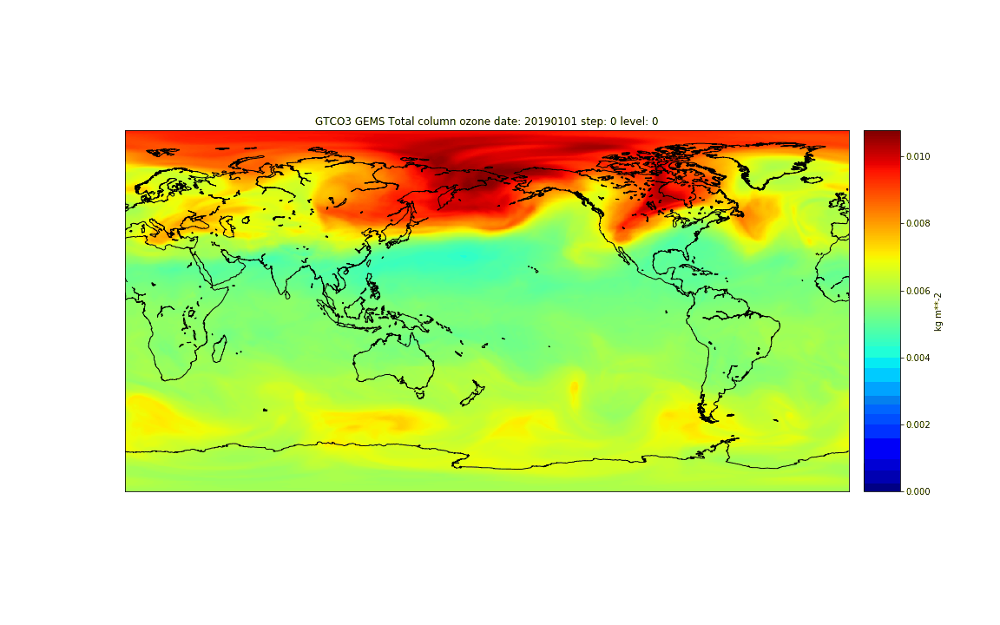

In [7]:
import imageio
import matplotlib.pyplot as plt
import numpy as np
import pygrib
from IPython.display import Image
from mpl_toolkits.basemap import Basemap
from matplotlib.pyplot import figure

# open a GRIB file
grbs = pygrib.open(output_filename)

grb = grbs.select()[0]
vmax = np.amax(grb.values)

# get the longitudes and the latitudes 
latitudes,longitudes = grb.latlons() 

unit = grb['units']

# create and save a figure for each grib message
for grb in grbs.select():
    figure(num=None, figsize=(16, 10))

    # create a map
    map_ = Basemap(projection='cyl', 
                   lat_ts=10,
                   llcrnrlon=longitudes.min(), 
                   urcrnrlon=longitudes.max(),
                   llcrnrlat=latitudes.min(),
                   urcrnrlat=latitudes.max(),
                   resolution='l')

    map_.drawcoastlines()

    x,y = map_(longitudes, latitudes)
    data = grb.values

    # display the data
    cs = map_.pcolormesh(x, y, data, cmap=plt.cm.jet, vmin=0, vmax=vmax)
    map_.colorbar(cs, label=unit)

    plt.title(f'{grb["parameterName"]} date: {grb["dataDate"]} step: {grb["stepRange"]} level: {grb["level"]}')
    plt.savefig(path.join(output_dir, f'result_{grb.messagenumber}'))
    plt.close()

result_filename = "result.gif"

images = [imageio.imread(path.join(output_dir, f'result_{i}.png')) for i in range(1, grbs.messages + 1)]
imageio.mimsave(path.join(output_dir, result_filename), images, 'GIF', duration=0.2)
display(Image(path.join(output_dir, result_filename)))